In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


### 라이브러리 설치 및 불러오기

In [ ]:
# SMP 설치
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null

# cv2 import 오류 해결
!pip install opencv-python-headless==4.1.2.30

# W&B 설치
!pip install wandb -qqq
import wandb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.8 MB 37 kB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.5.5.64
    Uninstalling opencv-python-headless-4.5.5.64:
      Successfully uninstalled opencv-python-headless-4.5.5.64
     |████████████████████████████████| 1.8 MB 5.1 MB/s 
     |████████████████████████████████| 145 kB 89.2 MB/s 
     |████████████████████████████████| 181 kB 84.6 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

import segmentation_models_pytorch as smp

In [ ]:
wandb.login(key="e69d085ec05b458b0471d003312b08757d96d215")

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
os.getcwd()

'/content'

### !디렉토리 설정

`train/test/valid`를 포함하는 가장 작은 폴더를 `PATH`로 설정해주세요.  

`ROOT`디렉토리에는 모델을 저장하고, 예측 이미지를 출력합니다.

In [ ]:
# PATH = "/content/drive/MyDrive/socar/ds_v2/defect/dent_defect"
# ROOT = "/content/drive/MyDrive/socar/"

# sample_preds_folder = os.path.join(ROOT, "sample_predictions")
# if not os.path.exists(sample_preds_folder):
#     os.makedirs(sample_preds_folder)

In [ ]:
ROOT = "/home/haminse/DATA"

d_type = int(input("원본 데이터는 0번, 노이즈 제거 데이터는 1번/"))
d_ls = ["accida_segmentation_dataset_v1", "noise_clean"]
if d_type == 1:
    dfo = int(input("defect: 0, fair: 1, original: 2/"))
    dfo_ls = ["defect", "fair", "original"]
dam_type = int(input("0: dent / 1: scratch / 2: spacing/"))
dam_ls = ["dent", "scratch", "spacing"]

if d_type == 0:
    PATH = os.path.join(ROOT, d_ls[d_type], dam_ls[dam_type])
else:
    PATH = os.path.join(ROOT, d_ls[d_type], dfo_ls[dfo], dam_ls[dam_type])

sample_preds_folder = os.path.join(ROOT, "sample_predictions")
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder)

원본 데이터는 0번, 노이즈 제거 데이터는 1번/1
defect: 0, fair: 1, original: 2/0
0: dent / 1: scratch / 2: spacing/0


### !클래스 분류
Multiclass labelling시에만 수정해주세요.

In [ ]:
# 분류할 클래스 목록
class_names = ['background', 'damage'] 
# 분류할 클래스의 색 지정
class_rgb_values = [[0, 0, 0], [255, 255, 255]]

select_classes = ['background', 'damage']
# 클래스 명을 인덱스화
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
# 인덱스 형태의 클래스 이름을 ndarray 형식으로 표현
select_class_rgb_values = np.array(class_rgb_values)[select_class_indices]

### !모델 설정
사용하실 파라미터는 [여기](https://smp.readthedocs.io/en/latest/)를 참조하세요.  

- `ENCODER`: Backbone 모델(Feature extraction)
- `ENCODER_WEIGHTS`: 사전학습된 가중치의 기반 데이터셋
- `CLASSES`: 분류할 클래스 목록
- `model`
    - `Unet`
    - `UnetPlusPlus`
    - `MAnet`
    - `Linknet`
    - `FPN`
    - `PSPNet`
    - `DeepLabV3`
    - `DeepLabV3Plus`
    - `PAN`

In [ ]:
ENCODER = 'timm-efficientnet-b7'
ENCODER_WEIGHTS = 'noisy-student'
CLASSES = class_names
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation

# 모델 선언
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)
# 인코더와 가중치를 활용화여 모델 사전학습
preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b7_ns-1dbc32de.pth" to /home/haminse/.cache/torch/hub/checkpoints/tf_efficientnet_b7_ns-1dbc32de.pth


  0%|          | 0.00/254M [00:00<?, ?B/s]

In [ ]:
# 모델 세이브 경로 설정
if d_type == 0:
    saved_model = os.path.join(ROOT, f'{d_ls[d_type]}_original_{dam_ls[dam_type]}_{model.__class__.__name__}_{ENCODER}.pth')
else:
    saved_model = os.path.join(ROOT, f'{d_ls[d_type]}_{dfo_ls[dfo]}_{dam_ls[dam_type]}_{model.__class__.__name__}_{ENCODER}.pth')

# 모델을 불러오고싶은 경우 주석을 풀고 경로를 설정해주세요
# if os.path.exists(saved_model):
#     model = torch.load(saved_model, map_location=DEVICE)

In [ ]:
# 모델을 불러오고싶은 경우 주석을 풀고 경로를 설정해주세요
#saved_model = os.path.join(ROOT, 'best_model.pth')
# if os.path.exists(saved_model):
#     model = torch.load(saved_model, map_location=DEVICE)

#### !모델 및 훈련용 매개변수 설정
세부사항은 [공식문서](https://smp.readthedocs.io/en/latest/)를 참조해주세요.
- `loss`
    - `JaccardLoss()`
    - `DiceLoss()`
    - `L1Loss()`
    - `MSELoss()`
    - `CrossEntropyLoss()`
    - `NLLLoss()`
    - `BCELoss()`
    - `BCEWithLogitsLoss()`

- `metrics`
    - `IoU()`
    - `Fscore()`
    - `Accuracy()`
    - `Recall()`
    - `Precision()`

In [ ]:
# 프로젝트명 설정해주세요.
project_name = "project_name"

TRAINING = True

EPOCHS = 100

lr = 3e-4

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## 뒤 내용에 적힌 loss들은 다음과 같이 코드를 돌리고,

loss = smp.utils.losses.JaccardLoss(
    ignore_channels=class_rgb_values[0]
    )

## 그렇지 않은 loss들은 아래와 같이 돌려주세요.(loss별로 파라미터 확인해야 합니다)
# loss = smp.losses.JaccardLoss(mode = 'binary')
# loss.__name__ = 'JaccardLoss'


metrics = [smp.utils.metrics.IoU(
    threshold=0.5, 
    ignore_channels=class_rgb_values[0])]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=lr)])

# lr 스케줄러(현재 미사용중)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5)

### 함수 선언

In [ ]:
def visualize(**images):
    """
    이미지를 한 줄로 시각화
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

    
# Perform one-hot-encoding on label    
def one_hot_encode(label, label_values):
    """
    마스크 이미지에서, 마스크에 해당하는 부분을 클래스의 인덱스 번호로 채우는 함수입니다.
    단일 segmentation일 경우: 마스크에 해당하는 부분을 1(damage)로 반환
    다중 segmentation일 경우: n번째 클래스에 해당하는 부분을 숫자n으로 반환
    # Args
        label: 마스크 이미지
        label_values: 마스크 이미지의 값

    # Returns
        label과 같은 크기지만 label_values로 채워진 2D array
    """
    semantic_map = []
    for color in label_values:
        equality = np.equal(label, color) # indicates identicality b/w 2 ndarray in boolean type
        class_map = np.all(equality, axis = -1)
        semantic_map.append (class_map)
    semantic_map = np.stack(semantic_map, axis = -1)

    return semantic_map


# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format(depth = num_classes) to a 2D array
    with only 1 channel, where each pixel value is the classified key.

    # Args
        image: The one-hot format image

    # Returns
        A 2D array with the same width & height of input, but with a depth size
        of 1, where each pixel value is the classified class key.
    """
    x = np.argmax(image, axis = -1)
    return x


# Perform color coding on the reverse one-hot outputs
def color_code_segmentation(image, label_values):
    """
    Given a 1-channel array if class keys, color code the segmentation results.
    
    # Args
        image: A single channel array where each value represents the class key.
        label_values

    # Returns
        Color-coded image for segmentation visualization.
    """
    color_codes = np.array(label_values)
    x = color_codes[image.astype(int)]

    return x


from albumentations.augmentations.geometric.functional import resize
def get_training_augmentation():
    train_transform = [    
        album.Resize(224, 224),
        album.Normalize(mean=(0.238, 0.236, 0.231), std=(0.145, 0.144, 0.144))
    ]
    return album.Compose(train_transform)


def get_validation_augmentation():   
    test_transform = [
        album.Resize(224, 224),
        album.Normalize(mean=(0.238, 0.236, 0.231), std=(0.145, 0.144, 0.144))
    ]
    return album.Compose(test_transform)


def get_test_resize():
    test_transform = [
        album.Resize(224, 224),
    #    album.Normalize(mean=(0.238, 0.236, 0.231), std=(0.145, 0.144, 0.144))
    ]
    return album.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """   
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)


# Center crop padded image / mask to original image dims
def crop_image(image, target_image_dims=[1500,1500, 3]):
   
    target_size = target_image_dims[0]
    image_size = len(image)
    padding = (image_size - target_size) // 2

    return image[
        padding:image_size - padding,
        padding:image_size - padding,
        :,
    ]

### 데이터셋 클래스 정의

In [ ]:
class CustomDataset(torch.utils.data.Dataset):
    """
    Images read, resized and normalized

    # Args
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_rgb_values (list): RGB values of selected classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transformation pipeline
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocess
            (e.g. normalization, shape manipulation, etc.)
    """

    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):


        self.image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        self.mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):

        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

In [ ]:
x_train_dir = os.path.join(PATH, 'train', 'images')
y_train_dir = os.path.join(PATH, 'train', 'masks')

x_val_dir = os.path.join(PATH, 'valid', 'images')
y_val_dir = os.path.join(PATH, 'valid', 'masks')

x_test_dir = os.path.join(PATH, 'test', 'images')
y_test_dir = os.path.join(PATH, 'test', 'masks')

### Train/valid/test 데이터셋 선언

In [ ]:
train_ds = CustomDataset(x_train_dir, y_train_dir, 
                         augmentation=get_training_augmentation(),
                         preprocessing=get_preprocessing(preprocessing_fn),
                         class_rgb_values=select_class_rgb_values,
)

val_ds = CustomDataset(x_val_dir, y_val_dir, 
                         augmentation=get_validation_augmentation(),
                         preprocessing=get_preprocessing(preprocessing_fn),
                         class_rgb_values=select_class_rgb_values,
)

test_ds = CustomDataset(
    x_test_dir, 
    y_test_dir,  
    augmentation=get_test_resize(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# test dataset for visualization (without preprocessing transformations)
test_ds_vis = CustomDataset(
    x_test_dir, 
    y_test_dir, 
    augmentation=get_test_resize(),
    class_rgb_values=select_class_rgb_values,
)

### 데이터로더 선언

In [ ]:
batch_size = 16
if len(train_ds) % batch_size == 1:
    batch_size += 2
    print(f"Batch size altered to {batch_size}")

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=5)
val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=2)
test_dl = DataLoader(test_ds)

## 모델 훈련

In [ ]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [ ]:
len(val_ds)

73

`ValueError: Expected more than 1 value per channel when training, got input size torch.Size([1, 256, 1, 1])` 발생 시
  
`len(dataset) % batch_size = 1`이 되지 않도록 조정해주세요.

In [ ]:
if TRAINING:

    wandb.init(
        project=project_name,
        name=f"{ENCODER}_{ENCODER_WEIGHTS}",
        config={
            "learning_rate": lr,
            "loss": f"{loss.__class__.__name__}",
            "epochs": EPOCHS,
        }
    )

    best_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(1, EPOCHS + 1):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_dl)
        valid_logs = valid_epoch.run(val_dl)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        wandb.log({"train":train_logs, "validation":valid_logs})

        # Save model if a better val IoU score is obtained
        if best_score < list(valid_logs.values())[-1]:
            best_score = list(valid_logs.values())[-1]
            torch.save(model, saved_model)
            print('Model saved!')

    wandb.finish()

In [ ]:
import IPython
IPython.display.Audio('/home/haminse/Bright 5.mp3', autoplay=True)

## 학습 결과 확인

In [ ]:
if os.path.exists(saved_model):
    best_model = torch.load(saved_model, map_location=DEVICE)
    print('Loaded model from a previous commit.')
else:
    pass

Loaded model from a previous commit.


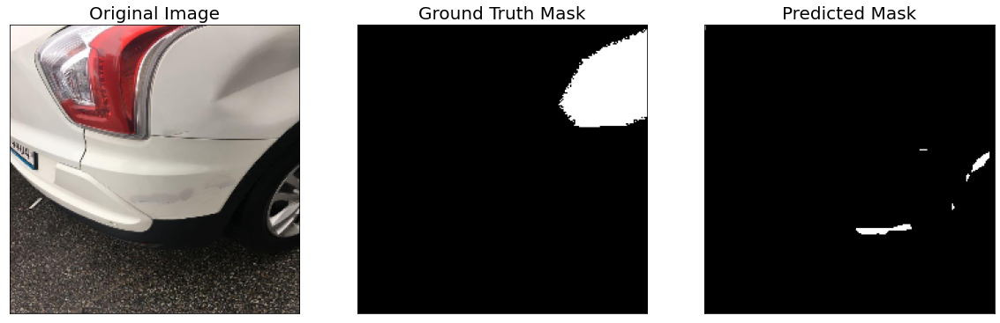

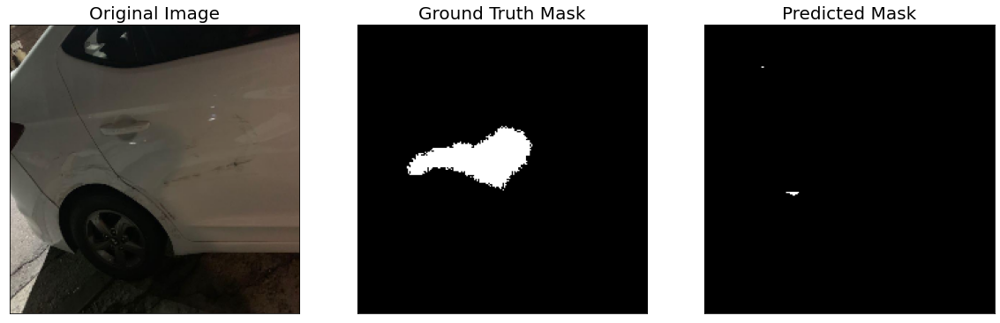

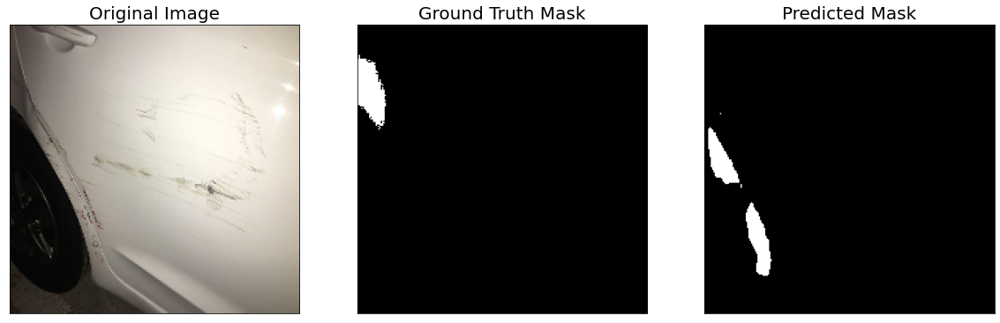

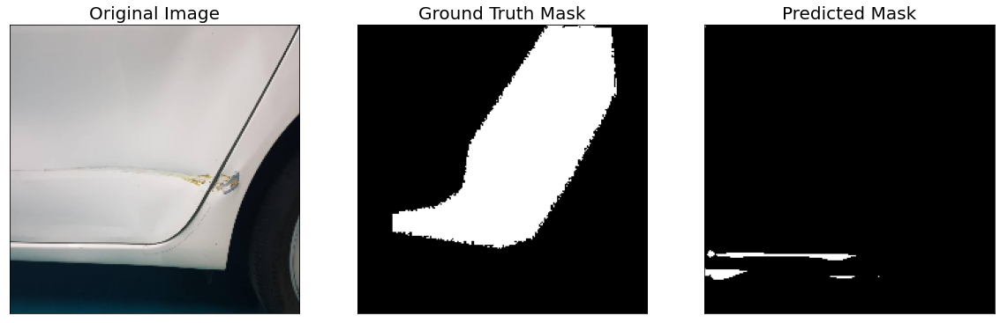

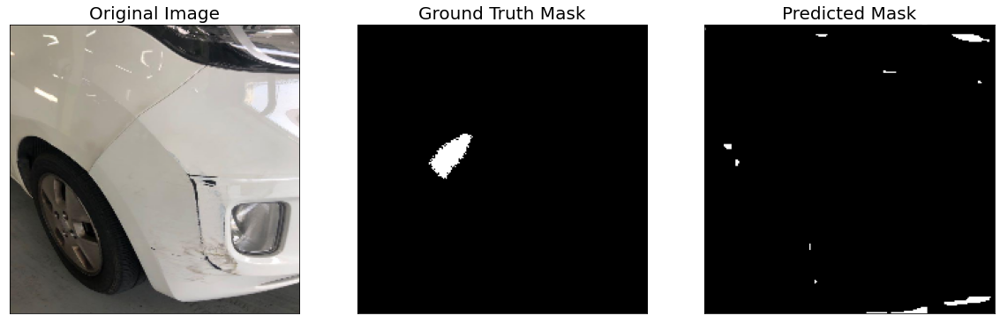

...

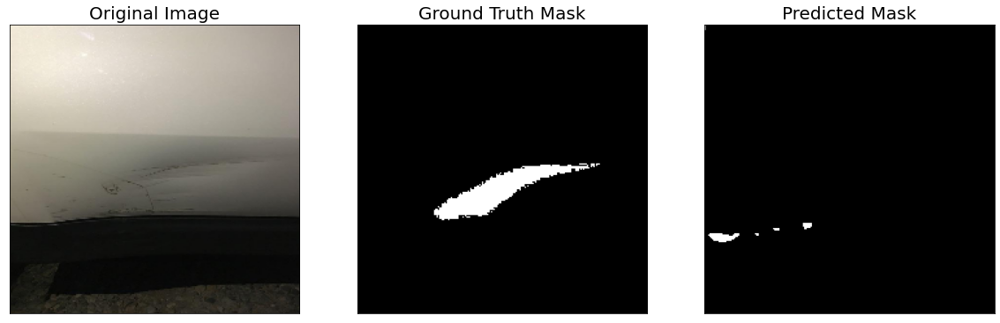

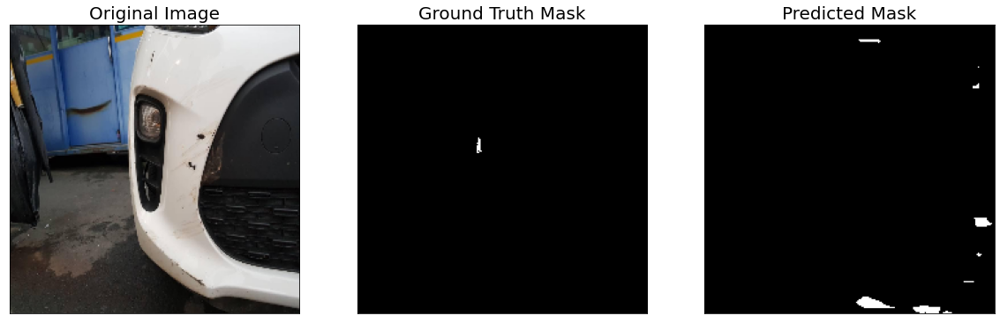

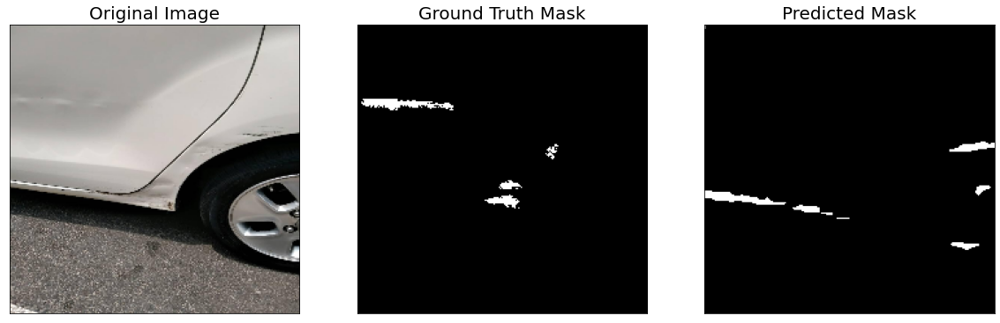

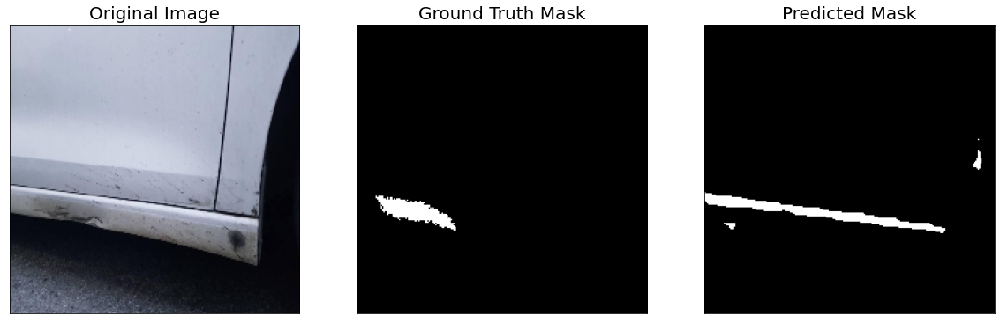

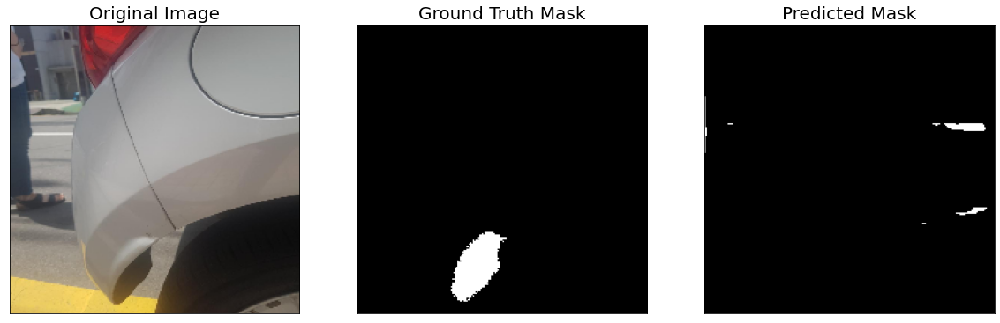

In [ ]:
for idx in range(len(test_ds)):
    image, gt_mask = test_ds[idx]
    image_vis = test_ds_vis[idx][0].astype('uint8')
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    # Predict test image
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()
    # Convert pred_mask from `CHW` format to `HWC` format
    pred_mask = np.transpose(pred_mask,(1,2,0))
    # Get prediction channel corresponding to damage
    pred_damage_heatmap = pred_mask[:,:,select_classes.index('damage')]
    pred_mask = crop_image(color_code_segmentation(reverse_one_hot(pred_mask), select_class_rgb_values))
    # Convert gt_mask from `CHW` format to `HWC` format
    gt_mask = np.transpose(gt_mask,(1,2,0))
    gt_mask = crop_image(color_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values))
    cv2.imwrite(os.path.join(sample_preds_folder, f"sample_pred_{model.__class__.__name__}_{idx}.png"), np.hstack([image_vis, gt_mask, pred_mask])[:,:,::-1])
    
    visualize(
        original_image = image_vis,
        ground_truth_mask = gt_mask,
        predicted_mask = pred_mask,
        #predicted_building_heatmap = pred_damage_heatmap
    )